In [4]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point
import requests

# Getting the earthquake data from USGS
url = 'https://earthquake.usgs.gov/earthquakes/feed/v1.0/summary/all_month.csv'
earthquake_data = pd.read_csv(url)

# We need to convert latitude and longitude to Points
geometry = [Point(xy) for xy in zip(earthquake_data['longitude'], earthquake_data['latitude'])]
crs = {'init': 'epsg:4326'}  # Coordinate Reference System (WGS84)

# As last we need to create a data frame
earthquakes_gdf = gpd.GeoDataFrame(earthquake_data, crs=crs, geometry=geometry)

C:\Users\Yasar\anaconda3\envs\geo\lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


In [5]:
import folium 
#Folium is a powerful and easy data visualization library in Python to visualize geospatial data

# Create a Folium map centered on the mean coordinates of earthquakes
m = folium.Map(location=[earthquakes_gdf['latitude'].mean(), earthquakes_gdf['longitude'].mean()],
               zoom_start=3, tiles='Stamen Terrain')

# Add markers for each earthquake
for idx, row in earthquakes_gdf.iterrows():
    folium.Marker([row['latitude'], row['longitude']], popup=f"Magnitude: {row['mag']}").add_to(m)

# Display the map
m

count    9994.000000
mean        1.542262
std         1.190007
min        -1.190000
25%         0.770000
50%         1.330000
75%         2.000000
max         6.700000
Name: mag, dtype: float64


<AxesSubplot:title={'center':'Distribution of Earthquake Magnitudes'}, ylabel='Frequency'>

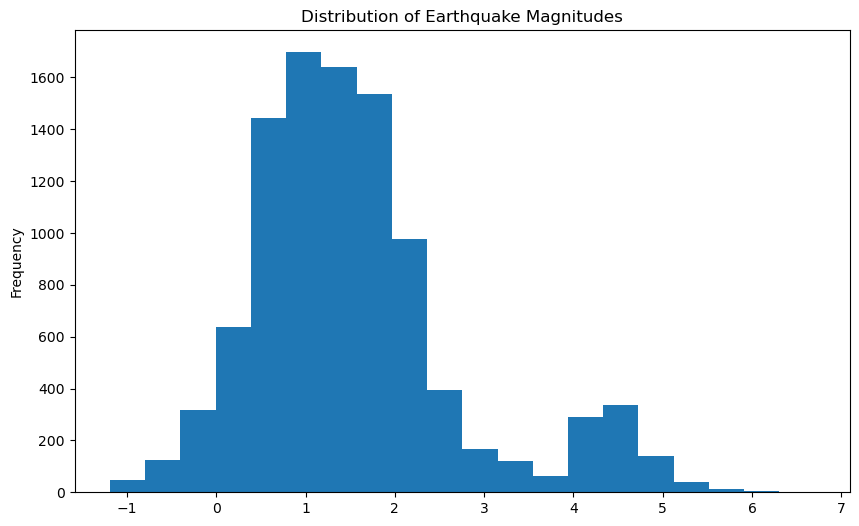

In [6]:
# We need to calculate the summary of statisctics
print(earthquakes_gdf['mag'].describe())

# Visualize the distribution of earthquake magnitudes
earthquakes_gdf['mag'].plot(kind='hist', bins=20, figsize=(10, 6), title='Distribution of Earthquake Magnitudes')